In [1]:
# libraries used
import boto3
import pandas as pd

import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from os import listdir, getcwd, chdir
from os.path import isfile, join
import os
from diff_predictor import core, data_process
from diff_classifier import pca
from matplotlib import colors as plt_colors

#import altair as alt
from mpl_toolkits.mplot3d import Axes3D

from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.preprocessing import StandardScaler, scale
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

from sklearn.cluster import KMeans, AgglomerativeClustering, AffinityPropagation, DBSCAN, SpectralClustering
from sklearn.mixture import GaussianMixture, BayesianGaussianMixture

import shap

Using current directory for loading/saving: /mnt/batch/tasks/shared/LS_root/mounts/clusters/nance8core/code/Users/nlsschim/diff_predictor/notebooks
To change current directory, call change_dir(...)


In [2]:
workbookDir = getcwd()
print('Current Notebook Dir: ' + workbookDir)
chdir(workbookDir) # Go to current workbook Dir
chdir('..')        # Go up one
print(f'Using current directory for loading data: {getcwd()}')
workbookDir = getcwd()

Current Notebook Dir: /mnt/batch/tasks/shared/LS_root/mounts/clusters/nance8core/code/Users/nlsschim/diff_predictor/notebooks
Using current directory for loading data: /mnt/batch/tasks/shared/LS_root/mounts/clusters/nance8core/code/Users/nlsschim/diff_predictor


In [6]:
dataset_path = workbookDir + '/data/features_ecm/'
#msd_path = workbookDir + '/nlsschim/raw_data_pnn/'
filelist = [f for f in listdir(dataset_path) if isfile(join(dataset_path, f)) and 'feat' in f]
#msd_filelist = [f for f in listdir(msd_path) if isfile(join(msd_path, f)) and 'msd' in f]
#print(len(msd_filelist))
print(len(filelist))

180


In [7]:
# Load in all data
fstats_tot = data_process.generate_fullstats(dataset_path, filelist, ['ChABC','NT'], 'Treatment')

ChABC
Adding file features_ChABC_brain_1_slice_1_vid_1.csv size: (502, 67)
NT
ChABC
Adding file features_ChABC_brain_1_slice_1_vid_2.csv size: (1734, 67)
NT
ChABC
Adding file features_ChABC_brain_1_slice_1_vid_3.csv size: (593, 67)
NT
ChABC
Adding file features_ChABC_brain_1_slice_1_vid_4.csv size: (258, 67)
NT
ChABC
Adding file features_ChABC_brain_1_slice_1_vid_5.csv size: (888, 67)
NT
ChABC
Adding file features_ChABC_brain_1_slice_2_vid_1.csv size: (1350, 67)
NT
ChABC
Adding file features_ChABC_brain_1_slice_2_vid_2.csv size: (690, 67)
NT
ChABC
Adding file features_ChABC_brain_1_slice_2_vid_3.csv size: (1257, 67)
NT
ChABC
Adding file features_ChABC_brain_1_slice_2_vid_4.csv size: (1070, 67)
NT
ChABC
Adding file features_ChABC_brain_1_slice_2_vid_5.csv size: (1097, 67)
NT
ChABC
Adding file features_ChABC_brain_1_slice_3_vid_1.csv size: (1141, 67)
NT
ChABC
Adding file features_ChABC_brain_1_slice_3_vid_2.csv size: (1307, 67)
NT
ChABC
Adding file features_ChABC_brain_1_slice_3_vid_3.cs

ChABC
NT
Adding file features_NT_brain_3_slice_2_vid_5.csv size: (893, 67)
ChABC
NT
Adding file features_NT_brain_3_slice_3_vid_1.csv size: (596, 67)
ChABC
NT
Adding file features_NT_brain_3_slice_3_vid_2.csv size: (378, 67)
ChABC
NT
Adding file features_NT_brain_3_slice_3_vid_3.csv size: (434, 67)
ChABC
NT
Adding file features_NT_brain_3_slice_3_vid_4.csv size: (515, 67)
ChABC
NT
Adding file features_NT_brain_3_slice_3_vid_5.csv size: (493, 67)
ChABC
NT
Adding file features_NT_brain_4_slice_1_vid_1.csv size: (780, 67)
ChABC
NT
Adding file features_NT_brain_4_slice_1_vid_2.csv size: (648, 67)
ChABC
NT
Adding file features_NT_brain_4_slice_1_vid_3.csv size: (294, 67)
ChABC
NT
Adding file features_NT_brain_4_slice_1_vid_4.csv size: (526, 67)
ChABC
NT
Adding file features_NT_brain_4_slice_1_vid_5.csv size: (624, 67)
ChABC
NT
Adding file features_NT_brain_4_slice_2_vid_1.csv size: (381, 67)
ChABC
NT
Adding file features_NT_brain_4_slice_2_vid_2.csv size: (1195, 67)
ChABC
NT
Adding file fea

In [8]:
# Look at a sample of the data
fstats_tot.head()

,Track_ID,alpha,D_fit,kurtosis,asymmetry1,asymmetry2,asymmetry3,AR,elongation,boundedness,...,Mean Mean_Intensity,Std Mean_Intensity,Mean SN_Ratio,Std SN_Ratio,Mean Deff1,Std Deff1,Mean Deff2,Std Deff2,Treatment,Video Number
0,0.0,0.816365,13.058749,2.551438,0.298735,0.541468,0.045251,1.580388,0.367244,0.055654,...,NaN,NaN,0.820048,0.032337,10.442310,1.272833,NaN,NaN,ChABC,0
1,1.0,1.161703,6.079955,2.095601,0.822425,0.220988,0.227570,2.116028,0.527416,0.124585,...,NaN,NaN,1.073503,0.216005,14.047563,0.000000,NaN,NaN,ChABC,0
2,2.0,0.917237,23.212111,1.744405,0.985075,0.061313,0.496155,4.052659,0.753248,0.083099,...,NaN,NaN,1.073503,0.216005,14.047563,0.000000,NaN,NaN,ChABC,0
3,3.0,0.118077,82.989569,1.882246,0.144911,0.669754,0.019753,1.159049,0.137224,0.078294,...,NaN,NaN,0.887472,0.073740,19.066433,12.801049,NaN,NaN,ChABC,0
4,4.0,1.157632,8.442376,3.135845,0.572443,0.372241,0.110529,1.324925,0.245240,0.058218,...,NaN,NaN,0.887472,0.073740,19.066433,12.801049,NaN,NaN,ChABC,0


In [11]:
fstats_tot[columns].isnull().sum()/len(fstats_tot)


alpha                0.002267
D_fit                0.002267
kurtosis             0.000007
asymmetry1           0.000007
asymmetry2           0.000007
asymmetry3           0.000007
AR                   0.000007
elongation           0.000007
boundedness          0.000007
fractal_dim          0.000007
trappedness          0.000007
efficiency           0.000007
straightness         0.000007
MSD_ratio            0.000007
Deff1                0.140292
Deff2                0.967309
Mean alpha           0.000070
Mean D_fit           0.000070
Mean kurtosis        0.000063
Mean asymmetry1      0.000063
Mean asymmetry2      0.000063
Mean asymmetry3      0.000063
Mean AR              0.000063
Mean elongation      0.000063
Mean boundedness     0.000063
Mean fractal_dim     0.000063
Mean trappedness     0.000063
Mean efficiency      0.000063
Mean straightness    0.000063
Mean MSD_ratio       0.000063
Mean Deff1           0.006655
Mean Deff2           0.732585
Treatment            0.000000
X         

In [28]:
# The column Deff2 currently has a super high number (~97%) of null values, so might be worth not including
# As such, it is commented out below
columns = [
    'alpha', # Fitted anomalous diffusion alpha exponenet
    'D_fit', # Fitted anomalous diffusion coefficient
    'kurtosis', # Kurtosis of track
    'asymmetry1', # Asymmetry of trajecory (0 for circular symmetric, 1 for linear)
    'asymmetry2', # Ratio of the smaller to larger principal radius of gyration
    'asymmetry3', # An asymmetric feature that accnts for non-cylindrically symmetric pt distributions
    'AR', # Aspect ratio of long and short side of trajectory's minimum bounding rectangle
    'elongation', # Est. of amount of extension of trajectory from centroid
    'boundedness', # How much a particle with Deff is restricted by a circular confinement of radius r
    'fractal_dim', # Measure of how complicated a self similar figure is
    'trappedness', # Probability that a particle with Deff is trapped in a region
    'efficiency', # Ratio of squared net displacement to the sum of squared step lengths
    'straightness', # Ratio of net displacement to the sum of squared step lengths
    'MSD_ratio', # MSD ratio of the track
   #'frames', # Number of frames the track spans
    'Deff1', # Effective diffusion coefficient at 0.33 s
    #'Deff2', # Effective diffusion coefficient at 3.3 s
    'Mean alpha',
    'Mean D_fit',
    'Mean kurtosis',
    'Mean asymmetry1',
    'Mean asymmetry2',
    'Mean asymmetry3',
    'Mean AR',
    'Mean elongation',
    'Mean boundedness',
    'Mean fractal_dim',
    'Mean trappedness',
    'Mean efficiency',
    'Mean straightness',
    'Mean MSD_ratio',
    'Mean Deff1',
    'Mean Deff2',
    'Treatment',
    'X',
    'Y'
]

target = 'Treatment'

ecm = fstats_tot[columns]#.drop(['Deff2', 'Mean Deff2', 'Std Deff2'], axis=1) # Removing since 97% is null
#ecm['Treatment'] = fstats_tot['Treatment']
ecm = ecm[~ecm.isin([np.nan, np.inf, -np.inf]).any(1)] # removes rows with nan or inf points

In [29]:
ecm.shape

(32150, 34)

In [38]:
# Make sure classes are balanced. 
bal_ecm = data_process.balance_data(ecm, target, random_state=1)
bal_ecm = ecm

Ratio before data balance (ChABC:NT) = 11507:20643
Ratio after balance (ChABC:NT) = 11507:11507


In [39]:
label_df = bal_ecm['Treatment']
features_df = bal_ecm.drop(['Treatment', 'X', 'Y'], axis=1).astype(float)
#df = df.astype(float)

# Data needs to be scaled for correlation, t-SNE, and PCA analysis
ss = StandardScaler()
scaled_data = pd.DataFrame(ss.fit_transform(features_df.values), columns=features_df.columns)

scaled_data = scale(scaled_data, axis=1)
scaled_df = pd.DataFrame(scaled_data, columns = features_df.columns)
scaled_df['Treatment'] = label_df.values
scaled_df.mean()

alpha               -0.039546
D_fit                0.014629
kurtosis            -0.022776
asymmetry1           0.127570
asymmetry2          -0.043131
asymmetry3           0.017038
AR                   0.007006
elongation           0.036893
boundedness         -0.030224
fractal_dim         -0.036951
trappedness         -0.029090
efficiency          -0.069357
straightness        -0.043618
MSD_ratio            0.014876
Deff1               -0.032625
Mean alpha           0.015107
Mean D_fit           0.054788
Mean kurtosis       -0.047803
Mean asymmetry1      0.113713
Mean asymmetry2     -0.034952
Mean asymmetry3      0.042118
Mean AR             -0.025182
Mean elongation      0.044176
Mean boundedness     0.000642
Mean fractal_dim    -0.081660
Mean trappedness     0.001083
Mean efficiency      0.021548
Mean straightness    0.045176
Mean MSD_ratio      -0.006446
Mean Deff1           0.014502
Mean Deff2          -0.027508
dtype: float64

We can generate a pair plot to see if any features follow similar patterns, which might provide the model with redundant data.

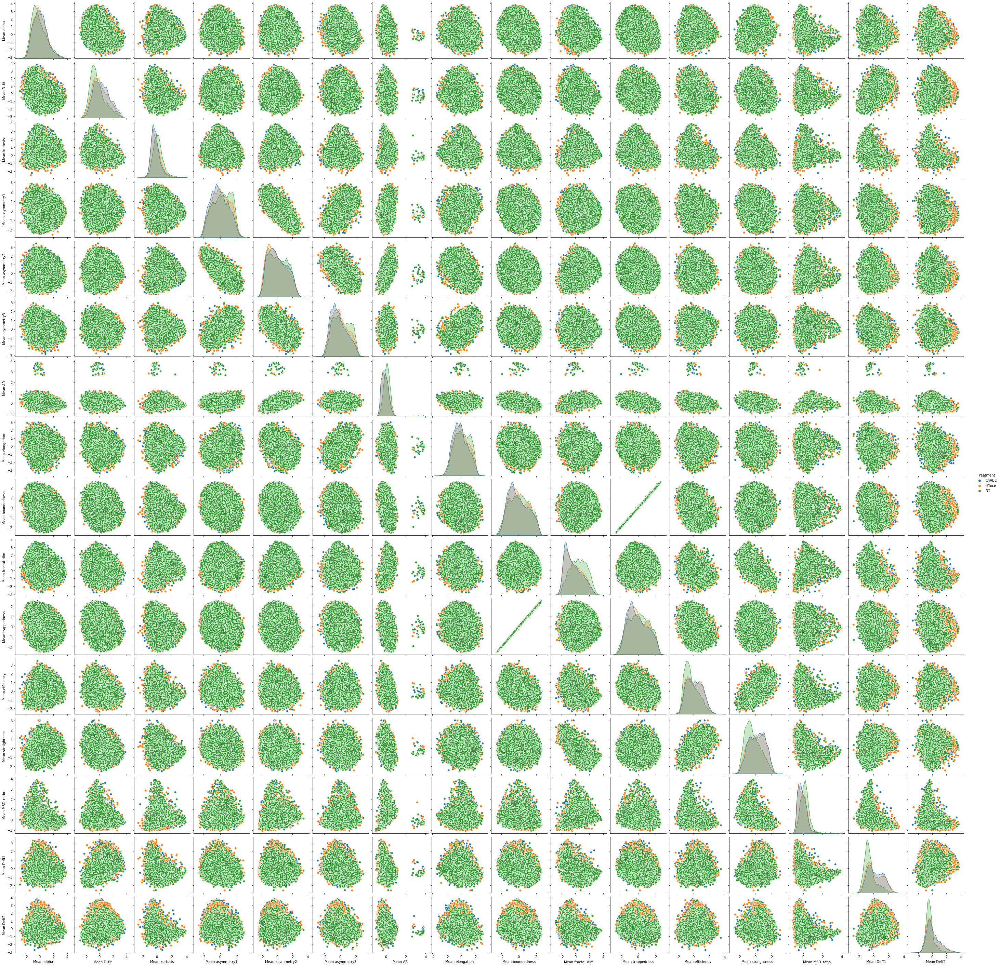

In [10]:
pairplot = sns.pairplot(scaled_df, hue='Treatment')
plt.savefig('scaled_ecm_pairplot.png', dpi=300)

We can use PCA loading to see which features are most important to explain the data. This can potentially allow us to selectively remove some features that are not very important

In [41]:
pcadataset = pca.pca_analysis(scaled_df, dropcols=['Treatment'], n_components=10, scale=True)
pcadataset.pcavals

Cumulative explained variance:
0 component: 0.2302235857434674
1 component: 0.36961237309123757
2 component: 0.48163546762130655
3 component: 0.5803396315973165
4 component: 0.6594946397328746
5 component: 0.7101685648704408
6 component: 0.7594883422054313
7 component: 0.794059036651772
8 component: 0.8232537913898335
9 component: 0.8510775700858955


,0,1,2,3,4,5,6,7,8,9
0,-1.100080,3.775561,-1.349237,1.174799,0.464457,-1.784191,-1.328486,0.497434,-0.679036,-0.227091
1,0.786321,4.215168,-2.240426,1.899481,1.185877,-1.086043,-1.294301,0.331422,-0.749709,-1.490113
2,-0.857509,2.734390,-1.894347,0.849333,2.221567,-1.752394,-0.805526,-0.873706,0.130983,0.416831
3,-0.513775,3.151939,-2.315362,0.049920,1.274683,-1.695076,-2.150350,-0.342784,-0.432371,-0.008202
4,-1.336170,3.631867,-1.127974,1.231561,0.207041,-2.029581,-1.451410,0.398359,-0.651724,-0.262583
...,...,...,...,...,...,...,...,...,...,...
32145,-1.140483,1.812814,0.340771,1.889342,-2.299751,0.435064,-1.468863,0.494974,-0.079206,-0.443352
32146,3.836676,2.291350,-1.931299,1.932223,-2.025597,-1.665468,-0.299739,-2.001339,0.571057,1.159535
32147,-1.615873,2.287182,-1.837632,-2.927410,1.786937,-0.346696,-1.604163,-0.577428,0.374060,0.024252
32148,0.300536,2.036291,-0.583305,1.141157,-4.247389,-0.532168,0.390464,-0.487047,1.295679,-1.432622


In [42]:
pcadataset.pcamodel

PCA(n_components=10)

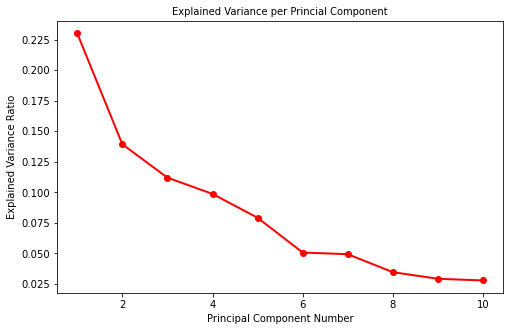

In [43]:
pca.screeplot(pcadataset.pcamodel)

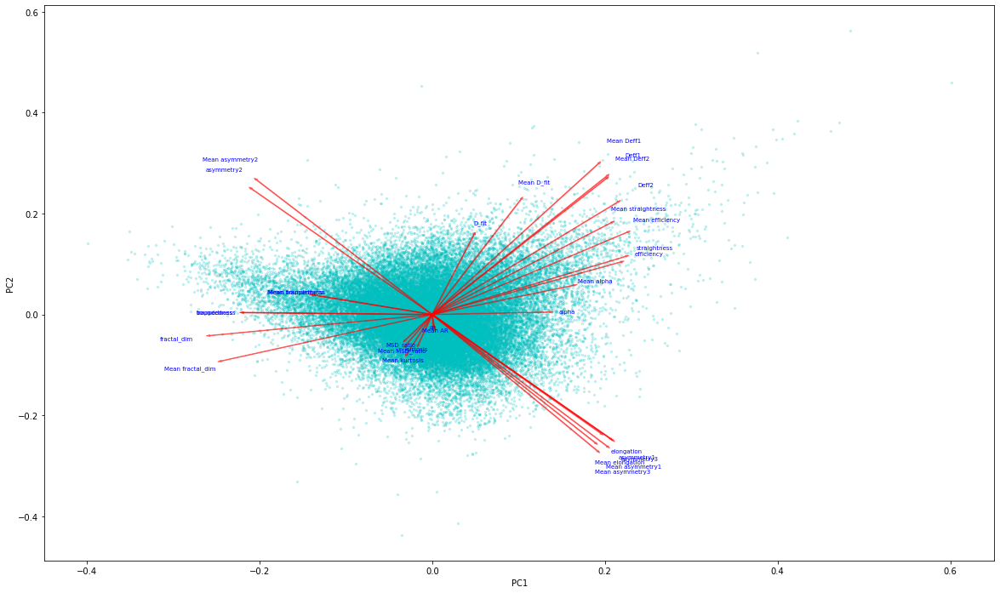

In [13]:
pca.bi_plot(pcadataset, features_df)

In [53]:
def bi_plot(pcadataset, dataset, **kwargs):
    """
    Creates and displays a bi-plot of PCA data
    
    Parameters:
    -----------
    pcadataset: Bunch object
        Created using the pca_analysis function. Must contain information about
        the PCA object model and the PCA components needed for the plot
    dataset: pandas.DataFrame
        DataFrame of the original data. Must have the original column names
    **kwargs: variable
        figsize: tuple
            size of the plot
        dotsize: int
            size of the dots for the datapoints
        scatter_alpha: int or float
            alpha value for the scatterplot datapoints
        scatter_color: string
            string represenation for the color of the scatterplot points
        arrow_color: str
            string representation for the plotted arrows for each data column
        arrow_alphha: float or int
            alpha value for the plotted arrows
        text_scale: int or float
            scaling value for the text correspinding to each columns name
        text_color: string
            string represenation for the color of the column names
        text_size: int or float
            size of displayed column names
        text_ha: string
            string for horizontal alignment of column names
        text_va: string
            string for vertical alignment of column names
        
    Output:
    -------
    plots the bi-plot of the PCA data
    
    """
    
    defaults = {'figsize': (20, 12), 'dotsize': 8, 'scatter_alpha': 0.6, 'scatter_color': 'coral', 
                'arrow_color': 'lightgrey', 'arrow_alpha': 0.5, 
                'text_scale': 1.15, 'text_color': 'k', 'text_size': 8.5, 
                'text_ha': 'center', 'text_va': 'center'}
    
    for defkey in defaults.keys():
        if defkey not in kwargs.keys():
            kwargs[defkey] = defaults[defkey]
    
    dataset = dataset.sample(frac=0.05)
    dataset = dataset.reset_index(drop=True)
    index = dataset.index
    nt_cond = dataset['Treatment'] == 'NT'
    chabc_cond = dataset['Treatment'] == 'ChABC'
    nt_inds = index[nt_cond]
    chabc_inds = index[chabc_cond]
    
    pcamodel = pcadataset.pcamodel
    components = pcadataset.pcavals
    fig = plt.figure(figsize=kwargs['figsize'])
    score = components.loc[:, :2]
    labels = list(dataset.columns)
    coeff = np.transpose(pcamodel.components_[0:2, :])
    xs = score.loc[:,0]
    ys = score.loc[:,1]
    n = coeff.shape[0]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    plt.scatter(xs.iloc[nt_inds]*scalex, ys[nt_inds]*scaley, s=kwargs['dotsize'], 
                alpha=kwargs['scatter_alpha'], color=kwargs['scatter_color'], label='NT')
    plt.scatter(xs.iloc[chabc_inds]*scalex, ys[chabc_inds]*scaley, s=kwargs['dotsize'], 
                alpha=kwargs['scatter_alpha'], color='g', label='ChABC')
    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color=kwargs['arrow_color'], alpha=kwargs['arrow_alpha'])
        plt.text(coeff[i,0]* kwargs['text_scale'], coeff[i,1]*kwargs['text_scale'],
                             labels[i], color=kwargs['text_color'], ha=kwargs['text_ha'],
                             va=kwargs['text_va'], size=kwargs['text_size'])
    plt.xlabel("PC{}".format(1))
    plt.ylabel("PC{}".format(2))
    plt.legend()
    plt.show()

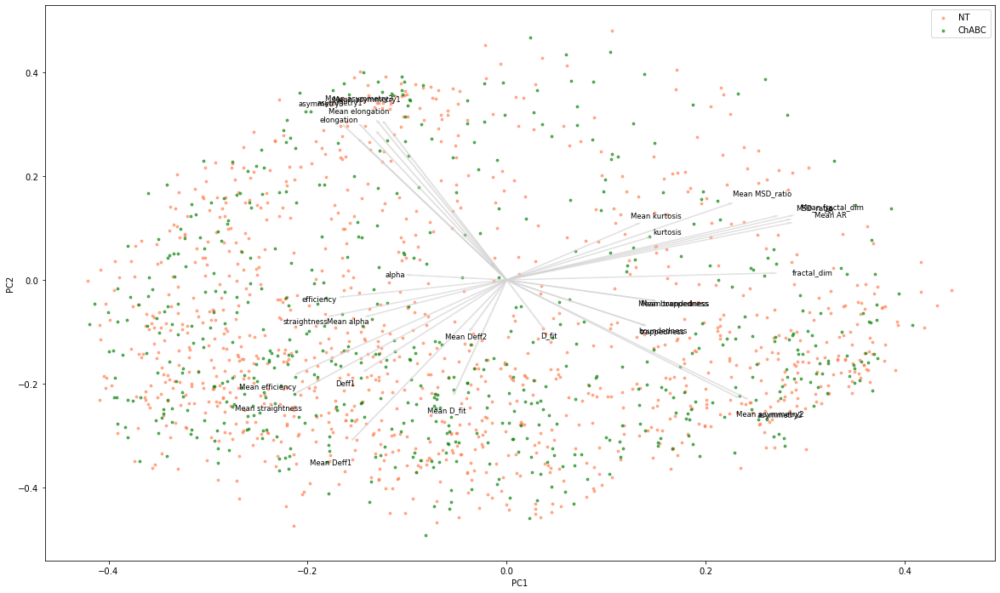

In [54]:
bi_plot(pcadataset, scaled_df)

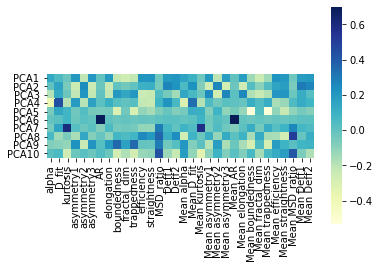

In [78]:
ax = sns.heatmap(pca_model.components_,
                 cmap='YlGnBu',
                 yticklabels=[ "PCA"+str(x) for x in range(1,pca_model.n_components_+1)],
                 xticklabels=list(features_df.columns),
                 cbar_kws={"orientation": "vertical"})
ax.set_aspect("equal")

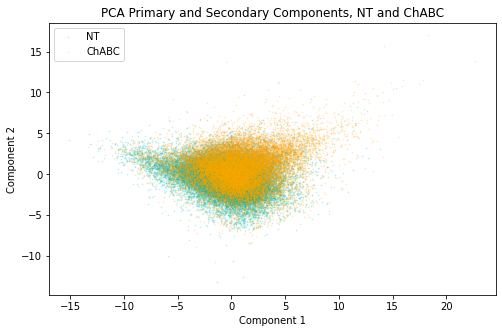

In [129]:
fig = plt.figure(figsize=(8,5))

df_nt =  components[components['Treatment'] == 'NT']
df_chabc =  components[components['Treatment'] == 'ChABC']

plt.scatter(x=df_nt['PC1'], y=df_nt['PC2'], label='NT', s=0.5, alpha=0.2, c='c')
plt.scatter(x=df_chabc['PC1'], y=df_chabc['PC2'], label='ChABC', s=0.5, alpha=0.2
            , c='orange')
plt.title('PCA Primary and Secondary Components, NT and ChABC')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.legend()

In [95]:
# Get the components usng PCA

pca_model = PCA(n_components=5)
pca_data = scaled_df.drop('Treatment', axis=1)
components = pca_model.fit_transform(pca_data)
print(components.shape)
print(pca_model.explained_variance_ratio_.sum())

(48404, 5)
0.713146344330334


[<matplotlib.lines.Line2D at 0x7fcf07924e10>]

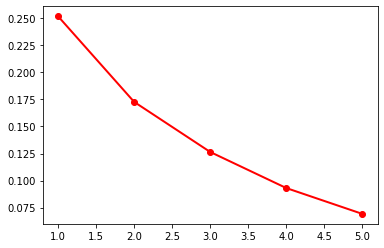

In [41]:
PC_values = np.arange(pca.n_components_) + 1
plt.plot(PC_values, pca.explained_variance_ratio_, 'ro-', linewidth=2)

In [12]:
loadings = pd.DataFrame(pca.components_.T, 
                        columns=['PC1', 'PC2'], 
                        index=pca_data.columns.to_list())
#loadings['Sum'] = loadings.sum(axis=1)
#loadings.sort_values(by='Sum', ascending=False)
loadings

,PC1,PC2
Mean alpha,-0.212273,0.049839
Mean D_fit,-0.102935,0.310486
Mean kurtosis,0.103601,-0.072907
Mean asymmetry1,-0.150041,-0.430415
Mean asymmetry2,0.301921,0.379804
Mean asymmetry3,-0.148129,-0.435822
Mean AR,0.075867,-0.028371
Mean elongation,-0.152285,-0.411990
Mean boundedness,0.370297,0.018271
Mean fractal_dim,0.448599,-0.134677


In [16]:
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
loading_matrix = pd.DataFrame(loadings, 
                        columns=['PC1', 'PC2'], 
                        index=pca_data.columns.to_list())
#loading_matrix['Sum'] = loadings.sum(axis=1)
#loading_matrix.sort_values(by='Sum', ascending=False)
loading_matrix

,PC1,PC2
Mean alpha,-0.480864,0.102873
Mean D_fit,-0.233178,0.640881
Mean kurtosis,0.234689,-0.150489
Mean asymmetry1,-0.339889,-0.888429
Mean asymmetry2,0.683943,0.783961
Mean asymmetry3,-0.335558,-0.899591
Mean AR,0.171861,-0.058562
Mean elongation,-0.344973,-0.850397
Mean boundedness,0.838835,0.037714
Mean fractal_dim,1.016213,-0.277990


In [30]:
from sklearn import decomposition
from sklearn import datasets
from sklearn.preprocessing import scale

# load iris dataset
iris = datasets.load_iris()

X = scale(iris.data)
y = iris.target

# apply PCA
pca = decomposition.PCA(n_components=2)
X = pca.fit_transform(X)

scree plot

Using t-sne

In [30]:
# Get components with TSNE
tsne = TSNE(n_components=2, n_jobs=-1, perplexity=30)
tsne_2comps = tsne.fit_transform(scaled_df.drop('Treatment', axis=1))

In [31]:
tsne_2comps

array([[-13.36245  ,  32.727444 ],
       [-19.369316 ,  -9.412525 ],
       [-19.369316 ,  -9.412525 ],
       ...,
       [ -3.8271246,   1.4015737],
       [ -5.4792547, -22.435143 ],
       [-28.278416 , -11.662147 ]], dtype=float32)

In [32]:
tsne_df_2comp = pd.DataFrame({'comp_1': tsne_2comps[:, 0],
                            'comp_2': tsne_2comps[:, 1], 
                            #'comp_3': tsne_3comps[:, 2],
                            'Treatment': label_df.values})

In [33]:
tsne_df_2comp.to_csv('tsne_2comp_perp30.csv')

In [4]:
tsne_df_3comp = pd.read_csv('~/cloudfiles/code/tsne_3comp.csv')


Text(0, 0.5, 'Component 2')

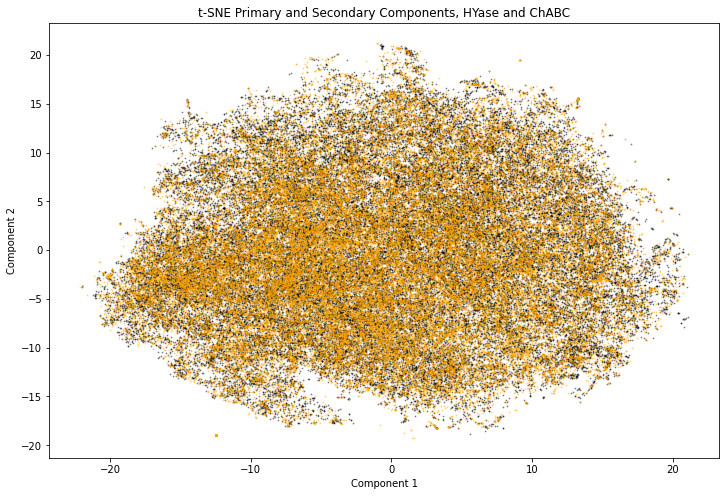

In [26]:
fig = plt.figure(figsize=(12,8))

df_nt =  tsne_df_3comp[tsne_df_3comp['Treatment'] == 'NT']
df_hyase =  tsne_df_3comp[tsne_df_3comp['Treatment'] == 'HYase']
df_chabc =  tsne_df_3comp[tsne_df_3comp['Treatment'] == 'ChABC']

#plt.scatter(x=df_nt['comp_1'], y=df_nt['comp_2'], label='NT', s=1, alpha=0.3, c='c')
plt.scatter(x=df_hyase['comp_1'], y=df_hyase['comp_2'], label='HYase', s=0.7, alpha=.4, c='k')
plt.scatter(x=df_chabc['comp_1'], y=df_chabc['comp_2'], label='ChABC', s=0.7, alpha=.4
            , c='orange')
plt.title('t-SNE Primary and Secondary Components, HYase and ChABC')
plt.xlabel('Component 1')
plt.ylabel('Component 2')

Text(0, 0.5, 'Component 3')

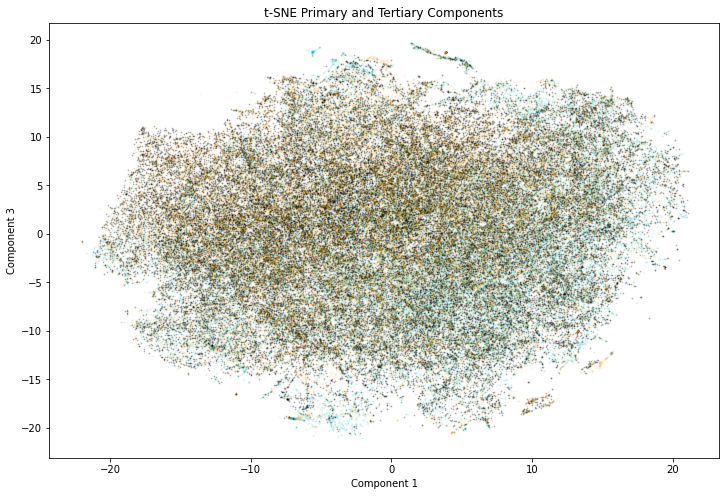

In [105]:
fig = plt.figure(figsize=(12,8))

plt.scatter(x=df_nt['comp_1'], y=df_nt['comp_3'], label='NT', s=0.5, alpha=0.1, c='c')
plt.scatter(x=df_hyase['comp_1'], y=df_hyase['comp_3'], label='HYase', s=0.5, alpha=0.25, c='k')
plt.scatter(x=df_chabc['comp_1'], y=df_chabc['comp_3'], label='ChABC', s=0.5, alpha=0.1, c='orange')
plt.title('t-SNE Primary and Tertiary Components')
plt.xlabel('Component 1')
plt.ylabel('Component 3')

Text(0, 0.5, 'Component 3')

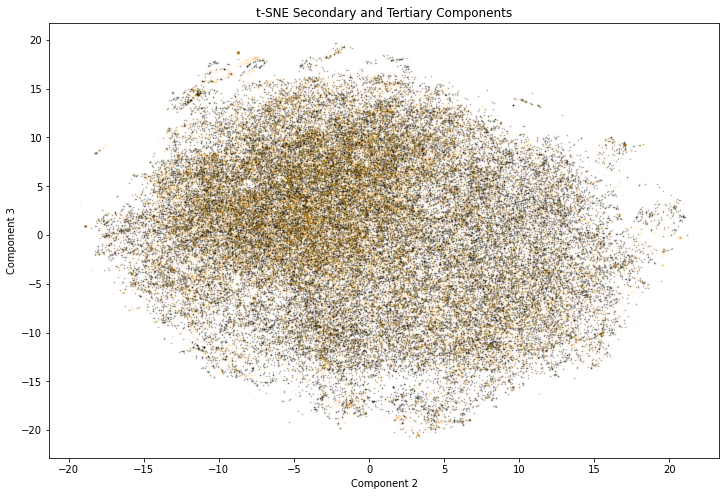

In [22]:
fig = plt.figure(figsize=(12,8))


#plt.scatter(x=df_nt['comp_2'], y=df_nt['comp_3'], label='NT', s=0.5, alpha=0.1, c='c')
plt.scatter(x=df_hyase['comp_2'], y=df_hyase['comp_3'], label='HYase', s=0.5, alpha=0.25, c='k')
plt.scatter(x=df_chabc['comp_2'], y=df_chabc['comp_3'], label='ChABC', s=0.5, alpha=0.1, c='orange')
plt.title('t-SNE Secondary and Tertiary Components')
plt.xlabel('Component 2')
plt.ylabel('Component 3')

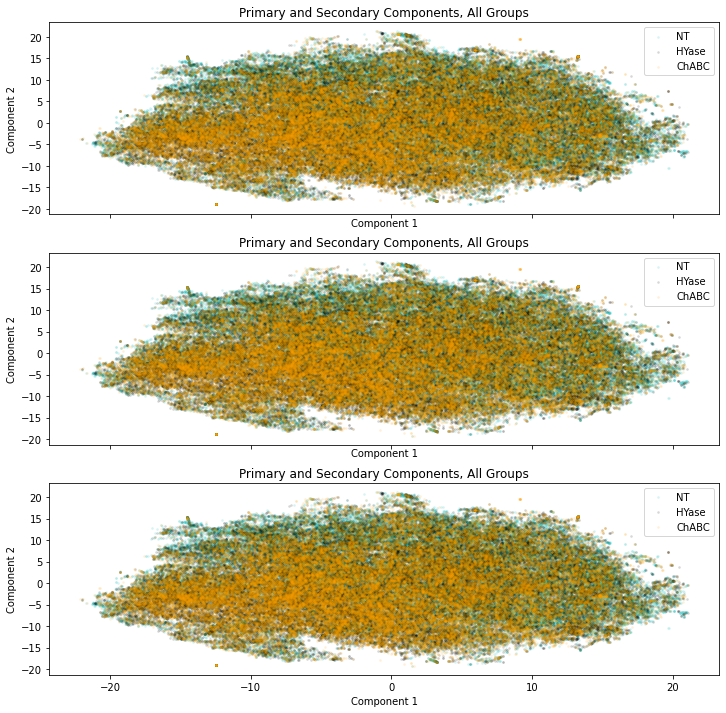

In [53]:
fig, ax = plt.subplots(3,1, sharex='col', sharey='row', figsize=(12,12))
color_list = ['orange', 'c', 'k']

df_nt =  tsne_df_3comp[tsne_df_3comp['Treatment'] == 'NT']
df_hyase =  tsne_df_3comp[tsne_df_3comp['Treatment'] == 'HYase']
df_chabc =  tsne_df_3comp[tsne_df_3comp['Treatment'] == 'ChABC']

ax[0].scatter(x=df_nt['comp_1'], y=df_nt['comp_2'], label='NT', s=3, alpha=0.1, c='c')
ax[0].scatter(x=df_hyase['comp_1'], y=df_hyase['comp_2'], label='HYase', s=3, alpha=0.1, c='k')
ax[0].scatter(x=df_chabc['comp_1'], y=df_chabc['comp_2'], label='ChABC', s=3, alpha=0.1, c='orange')
ax[0].set_title('Primary and Secondary Components, All Groups')
ax[0].set_xlabel('Component 1')
ax[0].set_ylabel('Component 2')
ax[0].legend()

ax[1].scatter(x=df_nt['comp_1'], y=df_nt['comp_2'], label='NT', s=3, alpha=0.1, c='c')
ax[1].scatter(x=df_hyase['comp_1'], y=df_hyase['comp_2'], label='HYase', s=3, alpha=0.1, c='k')
ax[1].scatter(x=df_chabc['comp_1'], y=df_chabc['comp_2'], label='ChABC', s=3, alpha=0.1, c='orange')
ax[1].set_title('Primary and Secondary Components, All Groups')
ax[1].set_xlabel('Component 1')
ax[1].set_ylabel('Component 2')
ax[1].legend()

ax[2].scatter(x=df_nt['comp_1'], y=df_nt['comp_2'], label='NT', s=3, alpha=0.1, c='c')
ax[2].scatter(x=df_hyase['comp_1'], y=df_hyase['comp_2'], label='HYase', s=3, alpha=0.1, c='k')
ax[2].scatter(x=df_chabc['comp_1'], y=df_chabc['comp_2'], label='ChABC', s=3, alpha=0.1, c='orange')
ax[2].set_title('Primary and Secondary Components, All Groups')
ax[2].set_xlabel('Component 1')
ax[2].set_ylabel('Component 2')
ax[2].legend()

Text(0.5, 0.98, 'Primary and Secondary t-SNE Components for Experimental Groups')

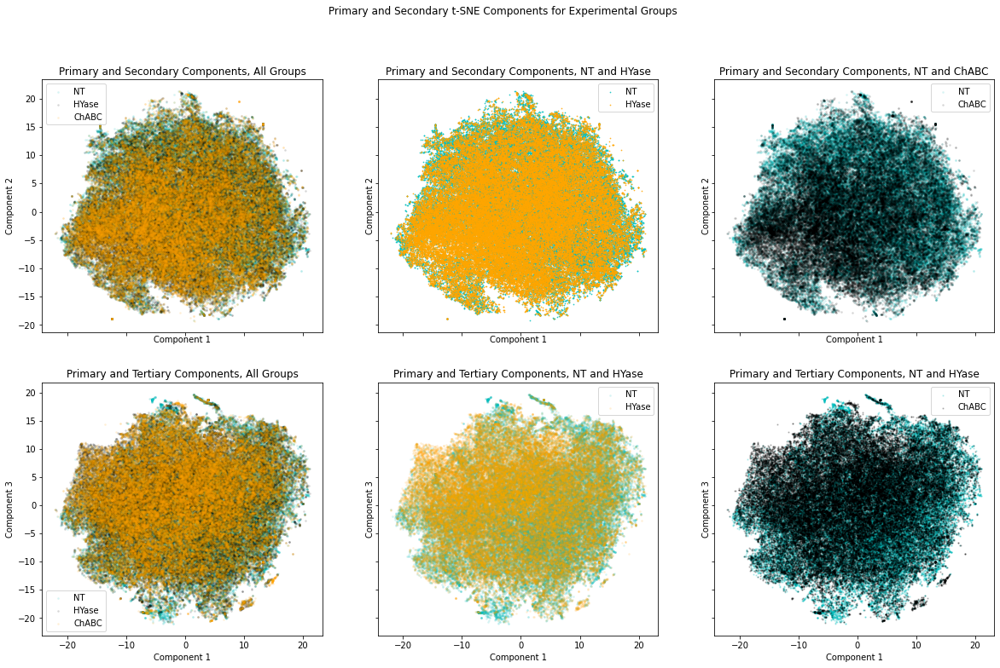

In [34]:
fig, ax = plt.subplots(2,3, sharex='col', sharey='row', figsize=(20,12))
color_list = ['orange', 'c', 'k']
# for i in range(len(result_cleaned['age'].unique())):
#     age = result_cleaned['age'].unique()[i]
    
#     df = tsne_df_3comp[tsne_df_3comp['age'] == age]
#     ax[0,0].scatter(x=df['comp_1'], y=df['comp_2'], label=age, s=3, alpha=0.5, c=color_list[i])
#     ax[0,0].legend()
#fig, ax = plt.subplots(2,2,figsize=(20,12))

df_nt =  tsne_df_3comp[tsne_df_3comp['Treatment'] == 'NT']
df_hyase =  tsne_df_3comp[tsne_df_3comp['Treatment'] == 'HYase']
df_chabc =  tsne_df_3comp[tsne_df_3comp['Treatment'] == 'ChABC']

ax[0,0].scatter(x=df_nt['comp_1'], y=df_nt['comp_2'], label='NT', s=3, alpha=0.1, c='c')
ax[0,0].scatter(x=df_hyase['comp_1'], y=df_hyase['comp_2'], label='HYase', s=3, alpha=0.1, c='k')
ax[0,0].scatter(x=df_chabc['comp_1'], y=df_chabc['comp_2'], label='ChABC', s=3, alpha=0.1, c='orange')
ax[0,0].set_title('Primary and Secondary Components, All Groups')
ax[0,0].set_xlabel('Component 1')
ax[0,0].set_ylabel('Component 2')
ax[0,0].legend()

ax[1,0].scatter(x=df_nt['comp_1'], y=df_nt['comp_3'], label='NT', s=3, alpha=0.1, c='c')
ax[1,0].scatter(x=df_hyase['comp_1'], y=df_hyase['comp_3'], label='HYase', s=3, alpha=0.1, c='k')
ax[1,0].scatter(x=df_chabc['comp_1'], y=df_chabc['comp_3'], label='ChABC', s=3, alpha=0.1, c='orange')
ax[1,0].set_title('Primary and Tertiary Components, All Groups')
ax[1,0].set_xlabel('Component 1')
ax[1,0].set_ylabel('Component 3')
ax[1,0].legend()

ax[0,1].scatter(x=df_nt['comp_1'], y=df_nt['comp_2'], label='NT', s=0.5, alpha=0.8, c='c')
ax[0,1].scatter(x=df_hyase['comp_1'], y=df_hyase['comp_2'], label='HYase', s=0.5, alpha=0.8, c='orange')
ax[0,1].set_title('Primary and Secondary Components, NT and HYase')
ax[0,1].set_xlabel('Component 1')
ax[0,1].set_ylabel('Component 2')
ax[0,1].legend()

ax[0,2].scatter(x=df_nt['comp_1'], y=df_nt['comp_2'], label='NT', s=3, alpha=0.1, c='c')
ax[0,2].scatter(x=df_chabc['comp_1'], y=df_chabc['comp_2'], label='ChABC', s=3, alpha=0.1, c='K')
ax[0,2].set_title('Primary and Secondary Components, NT and ChABC')
ax[0,2].set_xlabel('Component 1')
ax[0,2].set_ylabel('Component 2')
ax[0,2].legend()

# ax[1,1].scatter(x=df_70['comp_1'], y=df_70['comp_2'], label='70', s=3, alpha=0.5, c='orange')
# ax[1,1].scatter(x=df_35['comp_1'], y=df_35['comp_2'], label='35', s=3, alpha=0.5, c='k')
# ax[1,1].set_title('Primary and Secondary Components, Ages 35 and 70')
# ax[1,1].set_xlabel('Component 1')
# ax[1,1].set_ylabel('Component 2')
# ax[1,1].legend()

# ax[1,0].scatter(x=df_14['comp_1'], y=df_14['comp_2'], label='14', s=3, alpha=0.5, c='c')
# ax[1,0].scatter(x=df_35['comp_1'], y=df_35['comp_2'], label='35', s=3, alpha=0.5, c='K')
# ax[1,0].set_title('Primary and Secondary Components, Ages 14 and 35')
# ax[1,0].set_xlabel('Component 1')
# ax[1,0].set_ylabel('Component 2')
# ax[1,0].legend()

ax[1,2].scatter(x=df_nt['comp_1'], y=df_nt['comp_3'], label='NT', s=1.5, alpha=0.2, c='c')
ax[1,2].scatter(x=df_chabc['comp_1'], y=df_chabc['comp_3'], label='ChABC', s=1.5, alpha=0.2, c='k')
ax[1,2].set_title('Primary and Tertiary Components, NT and HYase')
ax[1,2].set_xlabel('Component 1')
ax[1,2].set_ylabel('Component 3')
ax[1,2].legend()

ax[1,1].scatter(x=df_nt['comp_1'], y=df_nt['comp_3'], label='NT', s=3, alpha=0.1, c='c')
ax[1,1].scatter(x=df_hyase['comp_1'], y=df_hyase['comp_3'], label='HYase', s=3, alpha=0.1, c='orange')
ax[1,1].set_title('Primary and Tertiary Components, NT and HYase')
ax[1,1].set_xlabel('Component 1')
ax[1,1].set_ylabel('Component 3')
ax[1,1].legend()

plt.suptitle('Primary and Secondary t-SNE Components for Experimental Groups')
#plt.savefig('t-sne_components_age.png', dpi=300)